In [1]:
%load_ext autoreload
%autoreload 2
%pylab inline

Populating the interactive namespace from numpy and matplotlib


In [75]:
import numpy as np
import tensorflow as tf
import os, sys, time, pickle
from matplotlib import gridspec

import utils, optimization, metrics, plot, data, evaluation
import plot
from model import WGanModel
from gan import CosmoGAN


In [67]:
ns = 64
k = 10

# WGAN Model

In [86]:
def current_time_str():
    import time, datetime
    d = datetime.datetime.fromtimestamp(time.time())
    return str(d.year)+ '_' + str(d.month)+ '_' + str(d.day)+ '_' + str(d.hour)+ '_' + str(d.minute)

time_str = current_time_str() 
#time_str = '2018_3_27_13_55'

global_path = '../saved_result/'

name = 'WGAN{}'.format(ns)

bn = False

params_discriminator = dict()
params_discriminator['stride'] = [2, 2, 2, 1]
params_discriminator['nfilter'] = [32, 32, 32, 16]
params_discriminator['shape'] = [[5, 5, 5],[5, 5, 5], [3, 3, 3], [3, 3, 3]]
params_discriminator['batch_norm'] = [bn, bn, bn, bn]
params_discriminator['full'] = [32]
params_discriminator['summary'] = True

params_generator = dict()
params_generator['stride'] = [2, 2, 2, 2, 2]
params_generator['latent_dim'] = 100
params_generator['nfilter'] = [8, 32, 64, 64, 1]
params_generator['shape'] = [[3, 3, 3], [3, 3, 3], [5, 5, 5], [5, 5, 5], [5, 5, 5]]
params_generator['batch_norm'] = [bn, bn, bn, bn]
params_generator['full'] = [2*2*2*8]
params_generator['summary'] = True
params_generator['non_lin'] = 'tanh'

params_optimization = dict()
params_optimization['gamma_gp'] = 10
params_optimization['batch_size'] = 8
params_optimization['gen_optimizer'] = 'rmsprop' # rmsprop / adam / sgd
params_optimization['disc_optimizer'] = 'rmsprop' # rmsprop / adam /sgd
params_optimization['disc_learning_rate'] = 3e-5
params_optimization['gen_learning_rate'] = 3e-5
params_optimization['beta1'] = 0.0
params_optimization['beta2'] = 0.9
params_optimization['epsilon'] = 1e-8
params_optimization['epoch'] = 50

params_cosmology = dict()
params_cosmology['clip_max_real'] = False
params_cosmology['log_clip'] = 0.1
params_cosmology['sigma_smooth'] = 1
params_cosmology['k'] = k
params_cosmology['Npsd'] = 50
params_cosmology['max_num_psd'] = 100

params = dict()
params['generator'] = params_generator
params['discriminator'] = params_discriminator
params['optimization'] = params_optimization
params['cosmology'] = params_cosmology

params['normalize'] = False
params['image_size'] = [ns, ns, ns]
params['prior_distribution'] = 'gaussian'
params['sum_every'] = 2
params['viz_every'] = 2
params['save_every'] = 2
params['print_every'] = 2
params['name'] = name
params['summary_dir'] = global_path + params['name'] + '_' + time_str +'summary/'

# 64x64x64 Gaussian Data

In [155]:
params['save_dir'] = '../64_by_64_synthetic_result/WGAN64_2018_3_19_16_8checkpoints/'
wgan = CosmoGAN(params, WGanModel, is_3d=True)

nsamples = 100
fake_gaus, fake_gaus_raw = wgan.generate(N=nsamples)
fake_gaus = np.squeeze(fake_gaus)
fake_gaus_raw = np.squeeze(fake_gaus_raw)

Generator 
------------------------------------------------------------
     The input is of size (?, 100)
     0 Full layer with 64 outputs
         Size of the variables: (?, 64)
     Reshape to (?, 2, 2, 2, 8)
     1 Deconv layer with 8 channels
         Size of the variables: (?, 4, 4, 4, 8)
     2 Deconv layer with 32 channels
         Size of the variables: (?, 8, 8, 8, 32)
     3 Deconv layer with 64 channels
         Size of the variables: (?, 16, 16, 16, 64)
     4 Deconv layer with 64 channels
         Size of the variables: (?, 32, 32, 32, 64)
     5 Deconv layer with 1 channels
         Size of the variables: (?, 64, 64, 64, 1)
    Non lienarity: tanh
     The output is of size (?, 64, 64, 64, 1)
------------------------------------------------------------

Discriminator 
------------------------------------------------------------
     The input is of size (?, 64, 64, 64, 1)
     0 Conv layer with 32 channels
         Size of the variables: (?, 32, 32, 32, 32)
     1 Conv 

In [156]:
dataset, real_gaus_raw = data.load.load_3d_synthetic_samples(nsamples = nsamples,dim=ns, k=k)

real_gaus = dataset.get_all_data()
print("Gaussian dataset shape: ", np.shape(real_gaus))

Gaussian dataset shape:  (100, 64, 64, 64)


### Display Real and Fake Samples

64x64x64 Gaussian Data
REAL SAMPLES                                               FAKE SAMPLES


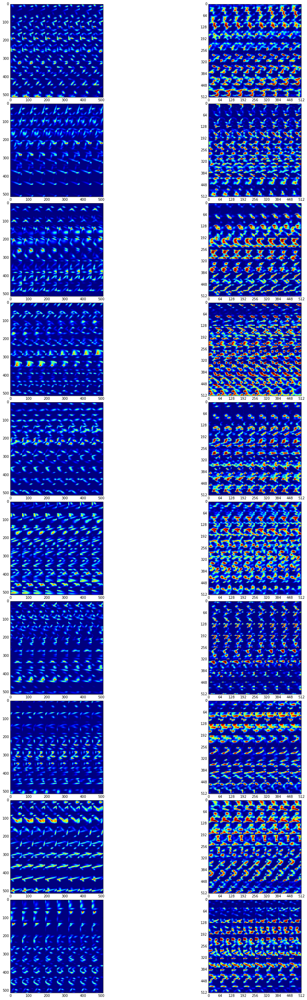

In [196]:
print('64x64x64 Gaussian Data')
print('REAL SAMPLES                                               FAKE SAMPLES')
fig = plt.figure(figsize=(20,40))

nsamples_to_display = 10
for i in range(nsamples_to_display):
    
    ax_real = plt.subplot2grid((nsamples_to_display, 2), (i, 0) )
    plot.tile_and_plot_3d_image(ax_real, real_gaus[i,:, :, :])
    
    ax_fake = plt.subplot2grid((nsamples_to_display, 2), (i, 1) )
    plot.tile_and_plot_3d_image(ax_fake, fake_gaus[i,:, :, :])
    
    plt.xticks(np.arange(0, 513, 64))
    plt.yticks(np.arange(0, 513, 64))
    
plt.tight_layout(pad=0.0, w_pad=0.0, h_pad=0.0)

### Display Real and Fake PSDs, Peak Counts, Mass Histogram

Log l2 PSD loss: 100.29195351082333
L2 PSD loss: 26366629917.61648
Log l1 PSD loss: 7.547887017805027
L1 PSD loss: 93251.63915255092


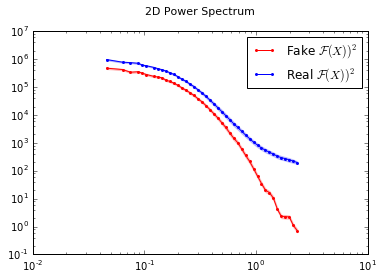

In [178]:
logel2, l2, logel1, l1 = evaluation.compute_and_plot_psd(real_gaus_raw, fake_gaus_raw, is_3d=True)

Log l2 Peak Count loss: 252.75223763867356
L2 Peak Count loss: 183893.695625
Log l1 Peak Count loss: 9.30370568276392
L1 Peak Count loss: 97.2345


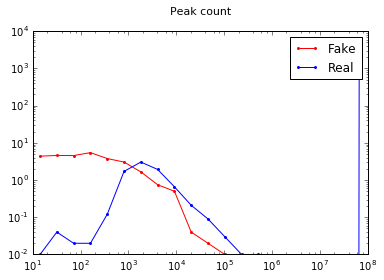

In [179]:
logel2, l2, logel1, l1 = evaluation.compute_and_plot_peak_cout(real_gaus_raw, fake_gaus_raw)

Log l2 Mass histogram loss: 176.05639705518337
L2 Peak Mass histogram: 13069449.943370031
Log l1 Mass histogram loss: 6.919633902486214
L1 Mass histogram loss: 1610.8210000000013


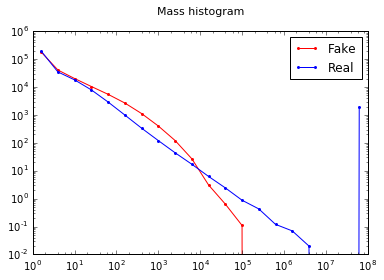

In [180]:
logel2, l2, logel1, l1 = evaluation.compute_and_plot_mass_hist(real_gaus_raw, fake_gaus_raw)

# 64x64x64 Nbody Data

In [157]:
params['save_dir'] = '../64_by_64_nbody_result/WGAN64_2018_3_25_5_21checkpoints/'
wgan = CosmoGAN(params, WGanModel, is_3d=True)

nsamples = 100
fake_nbody, fake_nbody_raw = wgan.generate(N=nsamples)
fake_nbody = np.squeeze(fake_nbody)
fake_nbody_raw = np.squeeze(fake_nbody_raw)

Generator 
------------------------------------------------------------
     The input is of size (?, 100)
     0 Full layer with 64 outputs
         Size of the variables: (?, 64)
     Reshape to (?, 2, 2, 2, 8)
     1 Deconv layer with 8 channels
         Size of the variables: (?, 4, 4, 4, 8)
     2 Deconv layer with 32 channels
         Size of the variables: (?, 8, 8, 8, 32)
     3 Deconv layer with 64 channels
         Size of the variables: (?, 16, 16, 16, 64)
     4 Deconv layer with 64 channels
         Size of the variables: (?, 32, 32, 32, 64)
     5 Deconv layer with 1 channels
         Size of the variables: (?, 64, 64, 64, 1)
    Non lienarity: tanh
     The output is of size (?, 64, 64, 64, 1)
------------------------------------------------------------

Discriminator 
------------------------------------------------------------
     The input is of size (?, 64, 64, 64, 1)
     0 Conv layer with 32 channels
         Size of the variables: (?, 32, 32, 32, 32)
     1 Conv 

In [158]:
dataset =  data.load.load_3d_dataset(spix=ns)
real_nbody = dataset.get_samples(N=nsamples)
real_nbody_raw = utils.backward_map(real_nbody)
print("Nbody dataset shape: ", np.shape(real_nbody))

Nbody dataset shape:  (100, 64, 64, 64)


### Display Real and Fake Samples

64x64x64 Nbody Data
REAL SAMPLES                                               FAKE SAMPLES


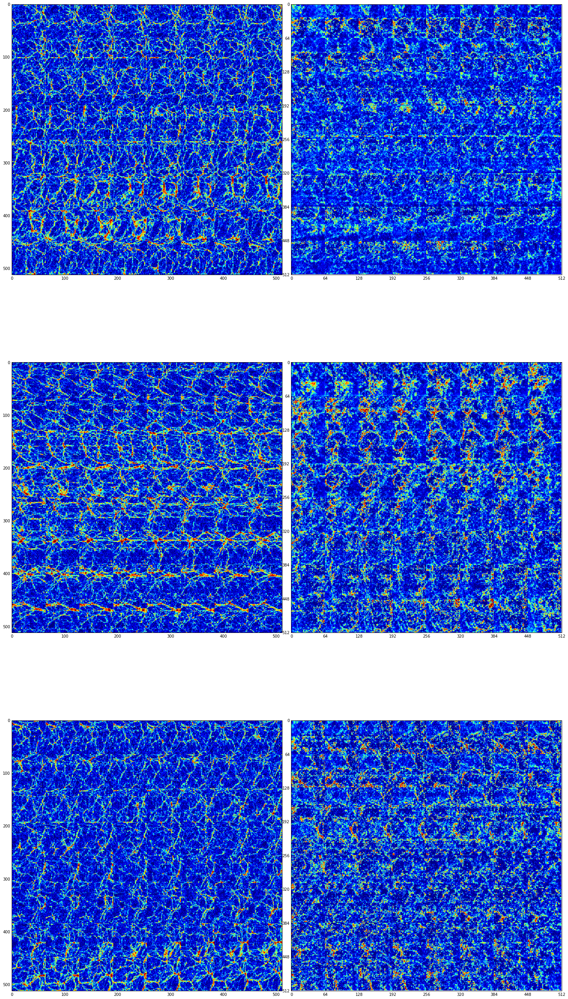

In [195]:
print('64x64x64 Nbody Data')
print('REAL SAMPLES                                               FAKE SAMPLES')
fig = plt.figure(figsize=(20,40))

nsamples_to_display = 3
for i in range(nsamples_to_display):
    
    ax_real = plt.subplot2grid((nsamples_to_display, 2), (i, 0) )
    plot.tile_and_plot_3d_image(ax_real, real_nbody[i,:, :, :])
    
    ax_fake = plt.subplot2grid((nsamples_to_display, 2), (i, 1) )
    plot.tile_and_plot_3d_image(ax_fake, fake_nbody[i+6,:, :, :])
    
    plt.xticks(np.arange(0, 513, 64))
    plt.yticks(np.arange(0, 513, 64))
    
plt.tight_layout(pad=0.0, w_pad=0.0, h_pad=0.0)

64x64x64 Nbody Data
REAL SAMPLES


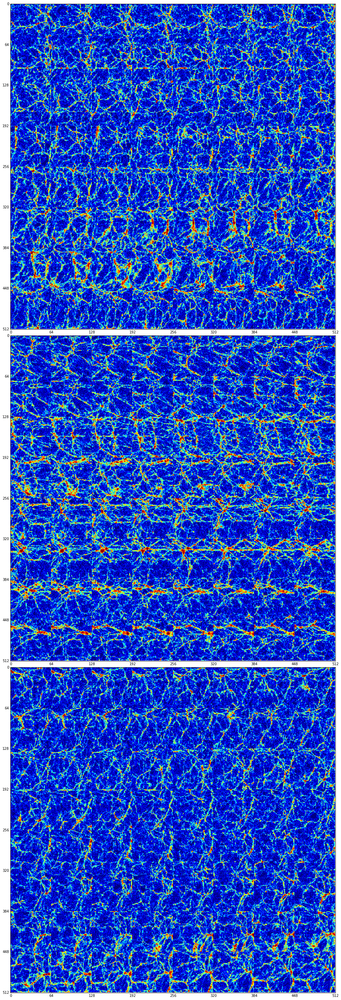

In [190]:
print('64x64x64 Nbody Data')
print('REAL SAMPLES')
fig = plt.figure(figsize=(20,40))

nsamples_to_display = 3
for i in range(nsamples_to_display):
    
    ax_real = plt.subplot2grid((nsamples_to_display, 1), (i, 0) )
    plot.tile_and_plot_3d_image(ax_real, real_nbody[i,:, :, :])
    
    plt.xticks(np.arange(0, 513, 64))
    plt.yticks(np.arange(0, 513, 64))
    
plt.tight_layout(pad=0.0, w_pad=0.0, h_pad=0.0)

64x64x64 Nbody Data
FAKE SAMPLES


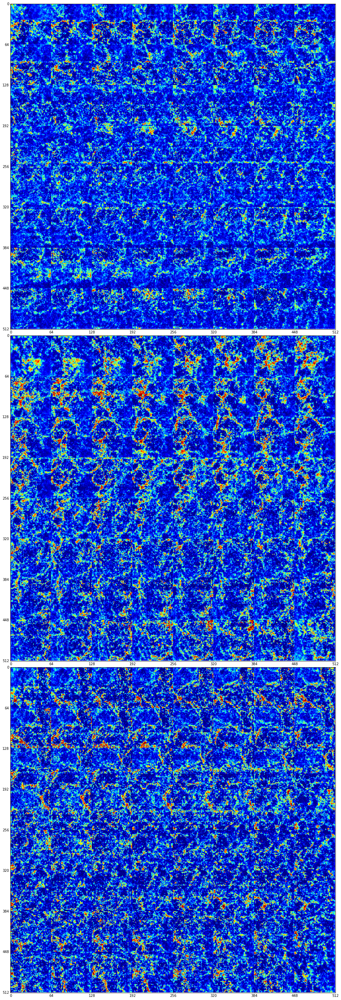

In [194]:
print('64x64x64 Nbody Data')
print('FAKE SAMPLES')
fig = plt.figure(figsize=(20,40))

nsamples_to_display = 3
for num, i in enumerate(range(6, 6+nsamples_to_display)):
    
    ax_fake = plt.subplot2grid((nsamples_to_display, 1), (num, 0) )
    plot.tile_and_plot_3d_image(ax_fake, fake_nbody[i,:, :, :])
    
    plt.xticks(np.arange(0, 513, 64))
    plt.yticks(np.arange(0, 513, 64))
    
plt.tight_layout(pad=0.0, w_pad=0.0, h_pad=0.0)

### Display Real and Fake PSDs, Peak Counts, Mass Histogram

Log l2 PSD loss: 75.78596738736547
L2 PSD loss: 545816317.5119277
Log l1 PSD loss: 7.275912618904642
L1 PSD loss: 19598.124585782913


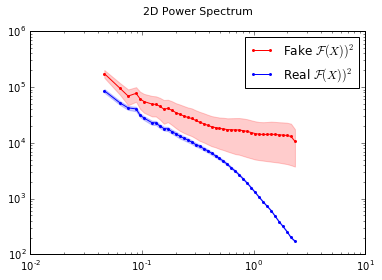

In [183]:
logel2, l2, logel1, l1 = evaluation.compute_and_plot_psd(real_nbody_raw, fake_nbody_raw, is_3d=True)

Log l2 Peak Count loss: 29.268101001252383
L2 Peak Count loss: 1996.0201550000002
Log l1 Peak Count loss: 3.6139412216508306
L1 Peak Count loss: 30.188499999999998


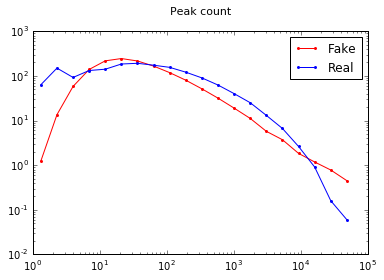

In [184]:
logel2, l2, logel1, l1 = evaluation.compute_and_plot_peak_cout(real_nbody_raw, fake_nbody_raw)

Log l2 Mass histogram loss: 10.91917788993828
L2 Peak Mass histogram: 123259683.93575501
Log l1 Mass histogram loss: 2.2305409303909918
L1 Mass histogram loss: 4417.057500000001


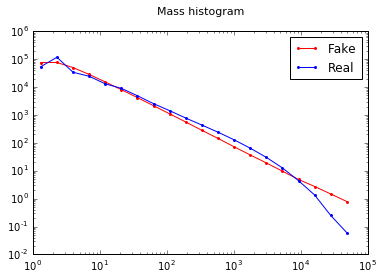

In [185]:
logel2, l2, logel1, l1 = evaluation.compute_and_plot_mass_hist(real_nbody_raw, fake_nbody_raw)